In [1]:
import mahotas as mh
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import ConfusionMatrixDisplay

The function has to work in the following way:

1. Download a csv file into a DataSet.
2. Download all the images described in the csv file: [mahotas.imread()]
3. Display first 50 images.
4. Form and return a DataSet that has to be an array of tuples [image, class code].

mh.imread() -> reads a image into a ndarray

In [2]:
def get_data(folder, file):
    plt.rcParams['axes.grid'] = False # Form a DataSet from a csv
    data = []
    print(folder + '/' + file)
    ds = pd.read_csv(folder+ '/'+ file + '.csv')
    print(ds)
    i=0
    r=0
    for im, c in ds.values:
        if i==0 and r<50:
            fig = plt.figure(figsize=(20,20)) # Display an image
        image = mh.imread(folder + '/' + file + '/' + im)
        data.append([image, c]) # Append finaly DataSet
        if r<50:
            plt.subplot(1, 5, i+1) # Create a table of images
            plt.imshow(image)
        i+=1
        if i==5:
            i=0
        r += 1
    plt.show()
    
    return np.array(data)
            

/Users/vigneshvc/Downloads/hiroshima-lemon/train_images
                  id  class_num
0     train_0000.jpg          0
1     train_0001.jpg          0
2     train_0002.jpg          0
3     train_0003.jpg          0
4     train_0004.jpg          0
...              ...        ...
1097  train_1097.jpg          1
1098  train_1098.jpg          0
1099  train_1099.jpg          1
1100  train_1100.jpg          2
1101  train_1101.jpg          0

[1102 rows x 2 columns]


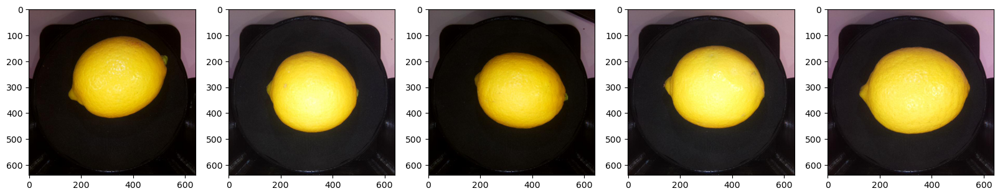

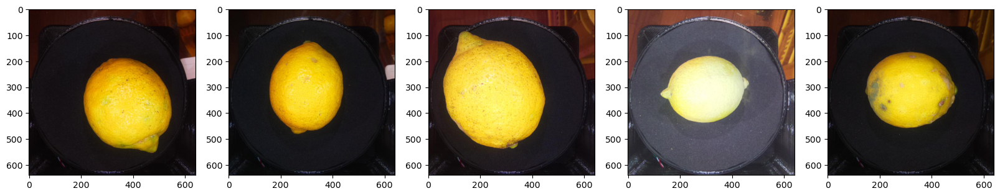

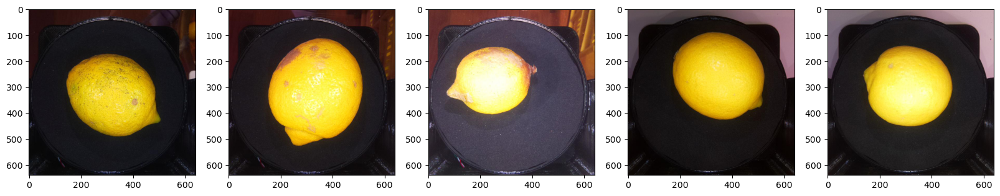

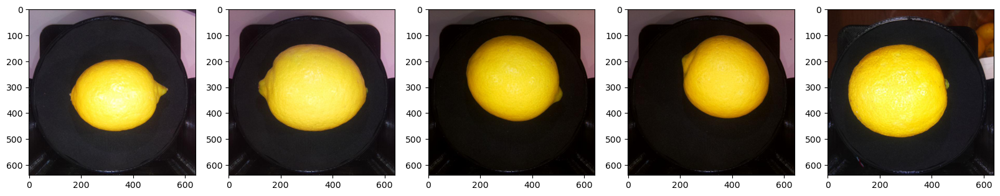

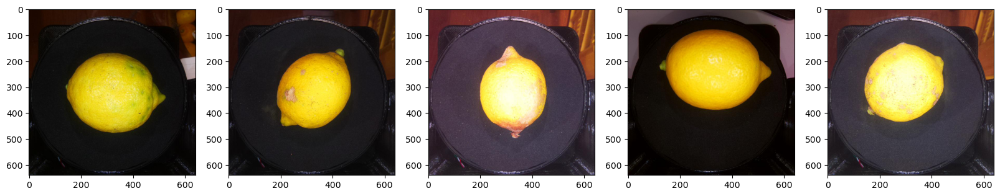

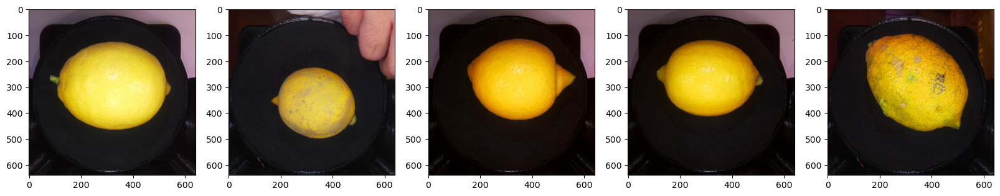

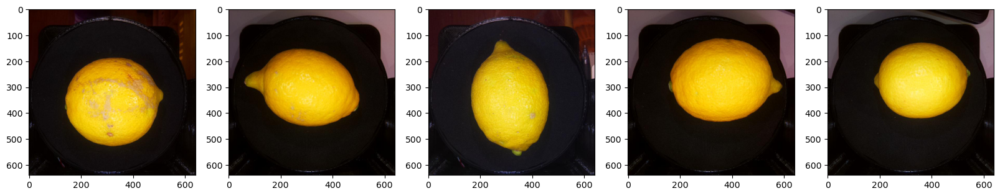

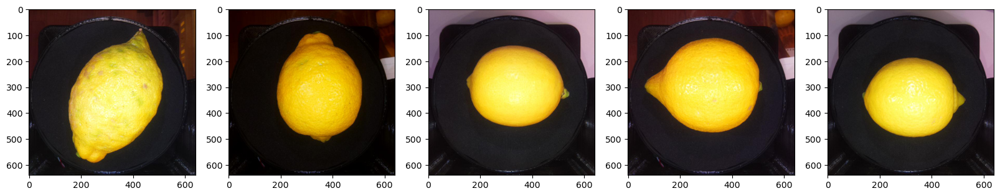

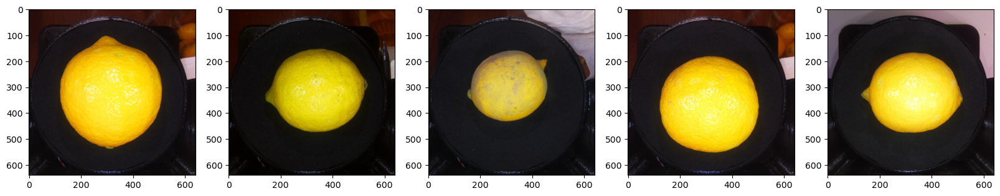

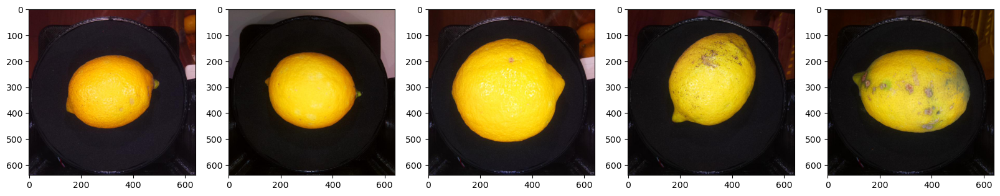

/var/folders/65/9kmp_vjn0ydf6zv12bt46r1c0000gn/T/ipykernel_1347/3134741368.py:23: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(data)


In [3]:
dataset_folder = 'hiroshima-lemon'
train_folder = 'train_images'
test_folder = 'test_images'
train = get_data(dataset_folder, train_folder)

<Axes: xlabel='Class', ylabel='count'>

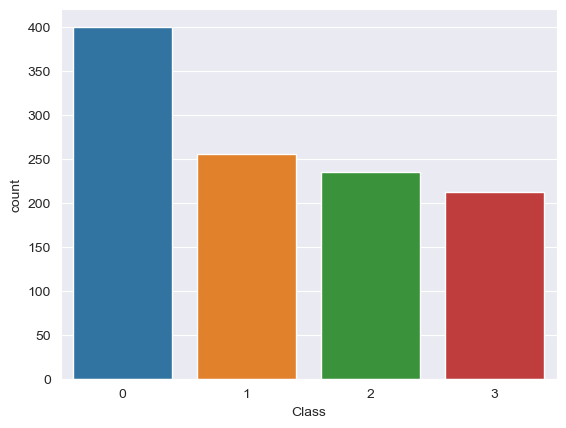

In [4]:
# visualizing our data using seaborn
c = pd.DataFrame(train[:, 1]) # only the class_code
c.columns = ['Class'] # setting column name
sns.set_style('darkgrid')
sns.countplot(x="Class", data=c)
# countplot returns Axes

You can see 3 classes that indicate the quality codes from 0 to 3

lets create a dictionary indicating the quality codes

In [5]:
class_names = {0: 'excellent', 1: 'good', 2:'processed', 3:'bad'}

In [6]:
# sklearn function to split data set
from sklearn.model_selection import train_test_split
im_train, im_val, c_train, c_val = train_test_split(train[:,0], train[:,1], test_size=0.3, shuffle = True)

c_train = c_train.astype('int')
c_val = c_val.astype('int')

In [7]:
print("Train shape", im_train.shape) # Size of training dataset
print("Test shape", im_val.shape) # Size of test dataset

Train shape (771,)
Test shape (331,)


<Axes: xlabel='Train Class Name', ylabel='count'>

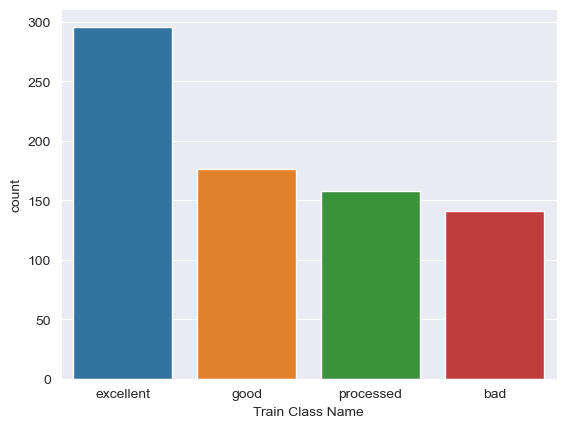

In [9]:
# Training Data - Data Visualization
c = pd.DataFrame(c_train)
c.columns = ['Train Class']
c['Train Class Name'] = c['Train Class'].map(class_names)
sns.set_style('darkgrid')
sns.countplot(x='Train Class Name', data=c, order=list(class_names.values()))

<Axes: xlabel='Validate Class Name', ylabel='count'>

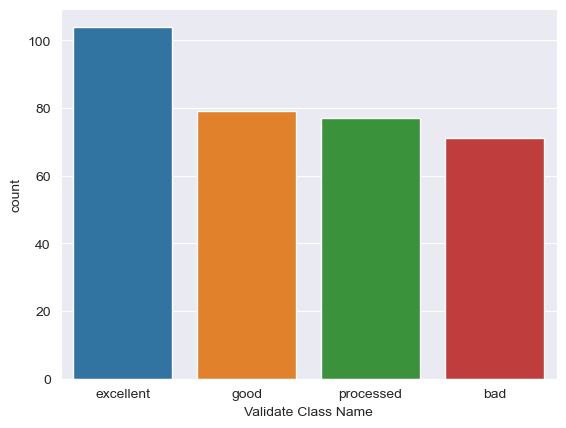

In [11]:
# Data Distribution
# Testing data
c = pd.DataFrame(c_val)
c.columns = ['Train Class']
# creating a new column and mapping the quality names
c['Validate Class Name'] = c['Train Class'].map(class_names)
sns.set_style('darkgrid')
sns.countplot(x='Validate Class Name', data=c, order=list(class_names.values()))


Quality of Lemon
excellent


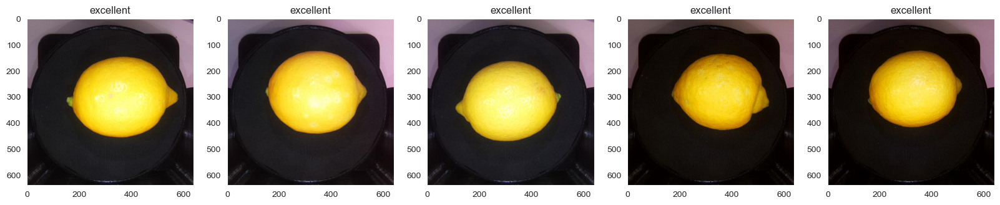

good


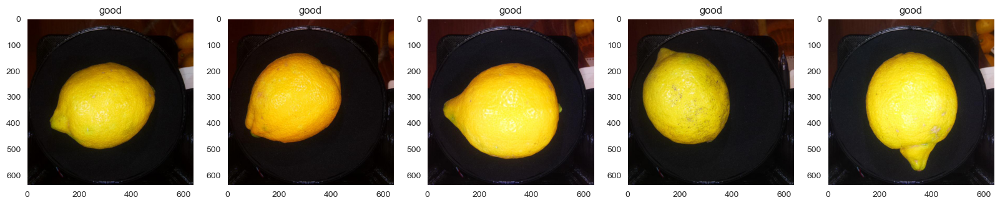

processed


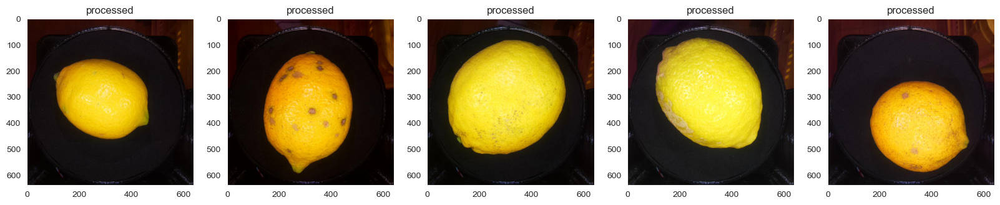

bad


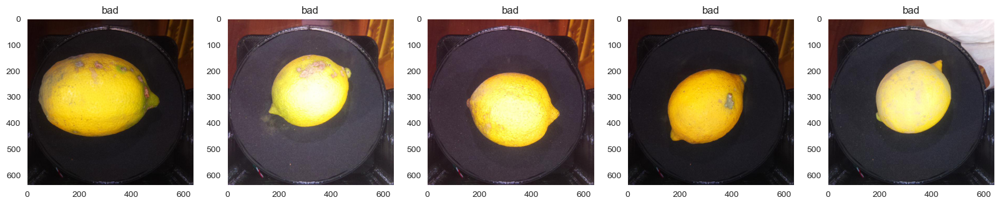

In [27]:
# Data Visualizaion

print("Quality of Lemon")
plt.rcParams['axes.grid'] = False
for c in class_names:
    ims = np.where(c_train == c)[0][:5] # getting the images ndarray from each category
    print(class_names[c])
    fig = plt.figure(figsize=(20,20))
    for i, im in enumerate(ims):
        plt.subplot(1, 5, i+1) # create a table of images
        # params passed above (nrows, ncols, index)
        plt.imshow(im_train[im])
        plt.title(class_names[c])
    plt.show()

# Image features creation¶

To classify objects, you need to transform the DataSet so that the input is a set of features, and the output is an object class. An image is a matrix of pixels. Each pixel is a color. Therefore it is impossible to submit a bare picture into a classical classifier's input. It is necessary to turn each picture into a set of certain features.

Mahotas makes it easy to calculate features from an image. The corresponding functions are found in the mahotas.features submodule. The Haralick set of texture features is well known. Like many image processing algorithms, it is named for its inventor. The features are based on textures, that is, they distinguish between structured and unstructured images, as well as various repetitive structures. With the help of mahotas, these features are calculated very easily: haralick_features = mh.features.haralick (image) haralick_features_mean = np.mean (haralick_features, axis = O) haralick_features_all = np.ravel (haralick_features) The mh.features.haralick function returns a 4 x 13 array with should be transformed into 1D by NumPy.ravel(). The first dimension is the four possible directions in which the features are calculated (vertical, horizontal, and two diagonals). If we are not interested in any particular direction, then we can average the features in all directions (in the code above, this variable is called haralick_features_mean). Alternatively, you can use all the characteristics individually (variable haralick_features_all). The choice depends on the properties of a particular dataset. We decided that the vertical and horizontal features should be stored separately in our case, so we use haralick_features_all.

In [29]:
# function to create image features
def create_features(im):
    features = []
    for image in im:
        im_grey = mh.colors.rgb2grey(image, dtype=np.uint8)
        features.append(mh.features.haralick(im_grey).ravel())
    features = np.array(features)
    return (features)

In [48]:
# look through what mh.features.haralick(image, dtype=uint8)
sample = im_train[0][1] # ndarr of one image
# sample.shape -> 3
feature = mh.features.haralick(sample) # returns ndarray
feature.shape #-> (4 , 13)
feature_raveled = feature.ravel() 
# .ravel() turns ndarray to 1d
# feature_raveled.shape -> 52

In [30]:
# this might take few mins
features_train = create_features(im_train)
features_val = create_features(im_val)

In [31]:
print(features_train.shape)
print(features_val.shape)

(771, 52)
(331, 52)


# Pipeline (sklearn.pipeline)
If we want to compare some classifiers, we should use a Pipeline. A Pipeline can be used to chain multiple estimators into one. This is useful as there is often a fixed sequence of steps in data processing, for example, feature selection, normalization and classification. A pipeline serves multiple purposes here:

You only have to call fit() once to evaluate a whole sequence of estimators.

You can grid search over parameters of all estimators in the pipeline at once.

Pipelines help to avoid leaking statistics from your test data into the trained model in cross-validation by ensuring that the same samples are used to train the transformers and predictors. All estimators in a pipeline, except the last one, should be transformers (i.e. should have a transform method). The last estimator may be of any type (transformer, classifier, etc.).

The sklearn.pipeline module implements utilities to build a composite estimator, as a chain of transforms and estimators.

The fit() and score() functions are used for training and evaluating the accuracy, this is an example of OOP polymorphism.

In order to test how it works we will use LogisticRegression.

#### We will use function ConfusionMatrixDisplay.from_estimator() for the analysis.

Training Dataset Accuracy :  93.6%
Testing Dataset Accuracy :  90.9%


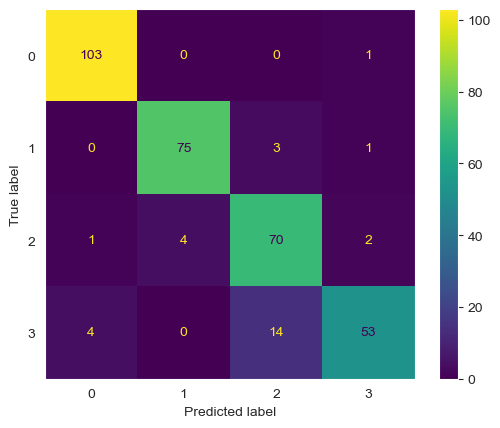

In [51]:
clf = Pipeline([ ('preproc', StandardScaler()), ('classifier', LogisticRegression(max_iter=1000)) ])
# Pipeline takes list of tuples as params

# fitting model
clf.fit(features_train, c_train)
# thats it, we can see the scores directly now

#training scores
score_train = clf.score(features_train, c_train)
#test scores
score_val = clf.score(features_val, c_val)

# printing results
print('Training Dataset Accuracy : {: .1%}'.format(score_train))
print('Testing Dataset Accuracy : {: .1%}'.format(score_val))

# Confusion Matrix - Model Evaluation
ConfusionMatrixDisplay.from_estimator(clf, features_val, c_val)
plt.show()

In [84]:
names = ["Logistic Regression", "Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Network", "AdaBoost",
         "Naive Bayes", "QDA"]

classifiers = [
    LogisticRegression(max_iter=1000),
    KNeighborsClassifier(3),
    SVC(kernel='linear', C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0*RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()
]

scores_train = []
scores_val = []

for name, clf in zip(names, classifiers):
    print("Fitting: ", name)
    clf = Pipeline([ ('preproc', StandardScaler()), ('classifier', clf) ])
    clf.fit(features_train, c_train)
    score_train = clf.score(features_train, c_train)
    score_val = clf.score(features_val, c_val)
    scores_train.append(score_train)
    scores_val.append(score_val)

Fitting:  Logistic Regression
Fitting:  Nearest Neighbors
Fitting:  Linear SVM
Fitting:  RBF SVM
Fitting:  Gaussian Process


/Users/vigneshvc/anaconda3/lib/python3.11/site-packages/sklearn/gaussian_process/kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/vigneshvc/anaconda3/lib/python3.11/site-packages/sklearn/gaussian_process/kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/Users/vigneshvc/anaconda3/lib/python3.11/site-packages/sklearn/gaussian_process/kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


Fitting:  Decision Tree
Fitting:  Random Forest
Fitting:  Neural Network
Fitting:  AdaBoost
Fitting:  Naive Bayes
Fitting:  QDA


/Users/vigneshvc/anaconda3/lib/python3.11/site-packages/sklearn/discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


In [85]:
# printing results as table
res = pd.DataFrame(index=names)
res['scores_train'] = scores_train
res['scores_val'] = scores_val
res.columns = ['Test', 'Validate']
res.index.name = "Classifier Accuracy"
pd.options.display.float_format = '{:,.2f}'.format
res.head(int(res.shape[0])) # all classifiers
# res.shape() -> returns a tuple

,Test,Validate
Classifier Accuracy,,
Logistic Regression,0.94,0.91
Nearest Neighbors,0.92,0.81
Linear SVM,0.79,0.75
RBF SVM,1.00,0.80
Gaussian Process,1.00,0.96
Decision Tree,0.85,0.71
Random Forest,0.82,0.73
Neural Network,0.96,0.91
AdaBoost,0.62,0.56


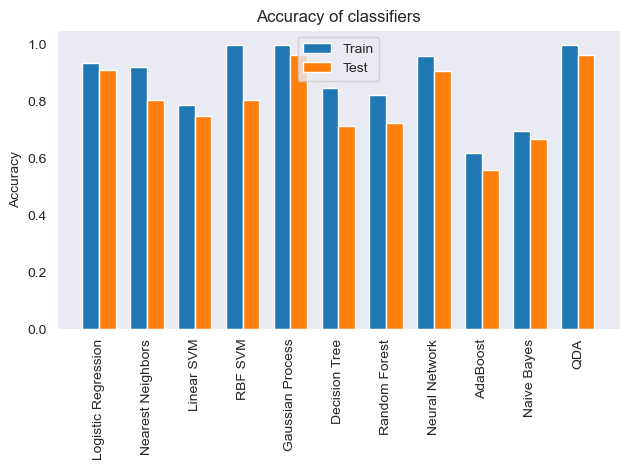

In [92]:
# Compare by plots

x = np.arange(len(names)) # label locations
width = 0.35 # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, scores_train, width, label='Train')
rects2 = ax.bar(x + width/2, scores_val, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy of classifiers')
ax.set_xticks(x)
plt.xticks(rotation = 90)
ax.set_xticklabels(names)
ax.legend()

fig.tight_layout()

plt.show()

Now we are taking the images in test_images folder then classify

In [93]:
# function To download test data
def get_test_data(folder, file):
    data = []
    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv')
    for im in ds.values:
        image = mh.imread(folder + '/' + file + '/' + im[0])
        data.append(image)
    return np.array(data)

In [94]:
test_folder = "test_images"
test = get_test_data(dataset_folder, test_folder)

/Users/vigneshvc/Downloads/hiroshima-lemon/test_images


In [95]:
# create features for test data
features_test = create_features(test)

In [96]:
print(test.shape)
print(features_test.shape)

(1651, 640, 640, 3)
(1651, 52)


In [97]:
# Making classification
clf = Pipeline([ ('preproc', StandardScaler()) , ('classifier', LogisticRegression(max_iter=1000)) ])
clf.fit(features_train, c_train)

Pipeline(steps=[('preproc', StandardScaler()),
                ('classifier', LogisticRegression(max_iter=1000))])

In [98]:
c_test = clf.predict(features_test)
c_test # a list

array([0, 3, 0, ..., 3, 0, 0])

Classification Results
excellent


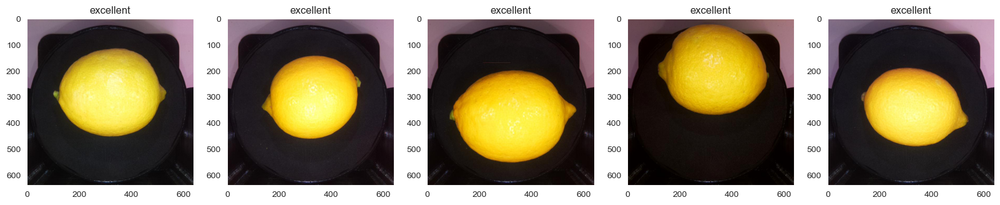

good


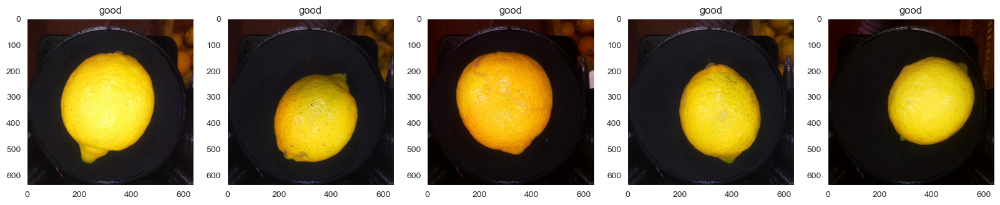

processed


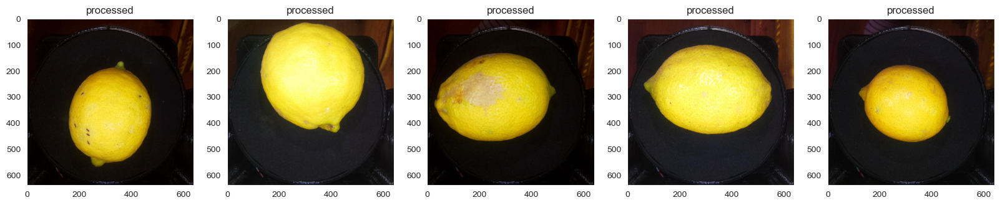

bad


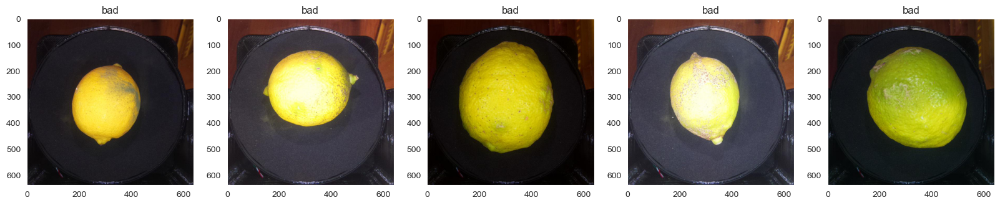

In [100]:
print("Classification Results")
for c in class_names:
    ims = np.where(c_test == c)[0][:5]
    print(class_names[c])
    fig = plt.figure(figsize=(20, 20))
    for i, im in enumerate(ims):
        plt.subplot(1, 5, i+1)
        plt.imshow(test[im])
        plt.title(class_names[c])
    plt.show()

In [102]:
# saving the results in a file
# a function
def safe_test_result(folder, file, res):
    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv')
    ds['Class'] = res
    print(ds)
    ds.to_csv('results.csv', index=False)
    return

In [103]:
safe_test_result(dataset_folder, test_folder, c_test)

/Users/vigneshvc/Downloads/hiroshima-lemon/test_images
                 id  Class
0     test_0000.jpg      0
1     test_0001.jpg      3
2     test_0002.jpg      0
3     test_0003.jpg      3
4     test_0004.jpg      0
...             ...    ...
1646  test_1646.jpg      3
1647  test_1647.jpg      2
1648  test_1648.jpg      3
1649  test_1649.jpg      0
1650  test_1650.jpg      0

[1651 rows x 2 columns]
